In [ ]:
* radius is around 1000m

Tips
* Offset: camera center is vehicle center.  Use vehicle center to claculate distance from center of lane
* implement "reset" feature in case lines are not detected in a few consecutive frames
* smoothing of lines
* Rubric: https://review.udacity.com/#!/rubrics/571/view


In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import glob

%matplotlib inline

DEBUGMODE = 0

img_path = './test_images/'

In [2]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255), debug=DEBUGMODE):
    """
    Receives RGB image
    
    Returns the binary image
    """
    # Calculate directional gradient
    thresh_min=thresh[0]
    thresh_max=thresh[1]

    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if (orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Apply threshold
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    # 6) Return this mask as your binary_output image
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sxbinary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255), debug=DEBUGMODE):
    """
    Receives RGB image
    Calculates and applies threshold
    Returns the binary image
    """
    # Calculate gradient magnitude
    thresh_min=mag_thresh[0]
    thresh_max=mag_thresh[1]

    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_mag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_mag/np.max(abs_mag))
    # Apply threshold
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    # 6) Return this mask as your binary_output image
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sxbinary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2), debug=DEBUGMODE):
    """
    Receives RGB image
    Applies threshold
    Returns the binary image
    """
    # Calculate gradient direction
    thresh_min=thresh[0]
    thresh_max=thresh[1]
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    abs_mag = np.sqrt(abs_sobelx**2 + abs_sobely**2)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dir_gradient = np.arctan2(abs_sobely, abs_sobelx)
    # Apply threshold
    # 5) Create a binary mask where direction thresholds are met
    sxbinary = np.zeros_like(dir_gradient)
    sxbinary[(dir_gradient >= thresh_min) & (dir_gradient <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return sxbinary

def hls_select(img, sthresh=(0, 255), debug=DEBUGMODE):
    """
    Receives RGB image
    Applies threshold on the S-channel of HLS (hue, lightness, and saturation)
    Returns the binary image
    """
    sthresh_min = sthresh[0]
    sthresh_max = sthresh[1]
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Grab the s-channel
    s_channel = hls[:,:,-1]    
    # 3) Apply a threshold to the S channel
    sbinary_output = np.zeros_like(s_channel)
    sbinary_output[(s_channel > sthresh_min) & (s_channel <= sthresh_max)] = 1
    # 4) Return a binary image of threshold result
    return sbinary_output

def hsv_select(img, vthresh=(0, 255), debug=DEBUGMODE):
    """
    Receives RGB image
    Applies threshold on the V-channel of HSV (hue, saturation, and value)
    Returns the binary image
    """
    vthresh_min = vthresh[0]
    vthresh_max = vthresh[1]
    # 1) Convert to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # 2) Grab the v-channel
    v_channel = hsv[:,:,-1]
    # 3) Apply a threshold to the V channel
    vbinary_output = np.zeros_like(v_channel)
    vbinary_output[(v_channel > vthresh_min) & (v_channel <= vthresh_max)] = 1
    # 4) Return a binary image of threshold result
    return vbinary_output

def color_select(img, sthresh=(0, 255), vthresh=(0, 255), debug=DEBUGMODE):

    sbinary = hls_select(img, sthresh=sthresh)
    vbinary = hsv_select(img, vthresh=vthresh)
    
    binary_output = np.zeros_like(sbinary)
    binary_output[(sbinary==1) & (vbinary==1)] = 1
    
    # 3) Return a binary image of threshold result
    return binary_output

def mask(img, debug=DEBUGMODE):
    """
    This function 
       receives the RGB image
    1) Converts to grayscale
    2) calculates the ROI mask
    3) applies an ROI mask
    4) Returns the binary mask
    """
    # 1) Convert to gray
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Calculate ROI mask
    height, width = gray.shape
    ROIvertices = np.array([[(0, height),                        # bottom left (x, y)
                          (width/2, height/1.8),                 # top left
                          (width/2, height/1.8),                 # top right
                          (width, height)]], dtype=np.int32)     # bottom right      

    # 3) Apply the ROI mask
    # Define blank mask to start with
    mask = np.zeros_like(gray)
    # Fill pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, ROIvertices, 255)

    mask_binary = np.zeros_like(mask)
    mask_binary[mask==255] = 1

    # 4) Return the binary mask
    return mask_binary

In [31]:
def get_edges(img, mtx, dist, debug=DEBUGMODE):
    """
    This function 
    1) receives the RGB image, mtx, and dst
    2) performs the following processing steps on it.
        * color and gradient thresholding
        * applies an ROI mask
    3) returns the processed binary image
    """
    
    # Choose a Sobel kernel size
    ksize = 9 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(30, 100))
    if(debug==1):
        cv2.imwrite(img_path+'gradx.jpg',gradx)

    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(30, 100))
    if(debug==1):
        cv2.imwrite(img_path+'grady.jpg',grady)

    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(50, 255)) #100
    if(debug==1):
        cv2.imwrite(img_path+'magbin.jpg', mag_binary)

    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.3))
    if(debug==1):
        cv2.imwrite(img_path+'dir_binary.jpg', dir_binary)

    color_binary = color_select(img, sthresh=(100, 255), vthresh=(100, 255))
    if(debug==1):
        cv2.imwrite(img_path+'color_binary.jpg',color_binary)
    
    mask_binary = mask(img)
    if(debug==1):
        cv2.imwrite(img_path+'mask_binary.jpg',mask_binary)
    
    combined = np.zeros_like(dir_binary)
    #combined[((((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))) & (mask_binary==1))] = 1
    combined[((((mag_binary == 1) & (dir_binary == 1))| (color_binary==1)) & (mask_binary==1))] = 1
    
    if(debug==1):
        cv2.imwrite(img_path+'combined.jpg',combined)

    return combined

In [58]:
def perspective_transform(img):
    """
    This function
    1) receives the binary image
    2) sets up the source and destination points
    3) performs transform to bird's eye view
    4) returns birdseye_image, transform and inverse transform matrices
    """
    img_size = (img.shape[1],img.shape[0])
    # image values estimated from: straight_lines1.jpg
    src_bottom_left = [256, 684]
    src_top_left = [597,449]
    src_bottom_right = [1035,673]
    src_top_right = [683,449]
    src = np.float32([src_bottom_left,src_top_left,src_top_right,src_bottom_right])
    
    # Set up the destination
    dest_x_left = 400  # Guessed.  Might want to change for tighter curves
    dest_x_right = 800 # Guessed.  Might want to change for tighter curves
    dest_bottom_left = [dest_x_left, img_size[1]]
    dest_top_left = [dest_x_left,0]
    dest_bottom_right = [dest_x_right,img_size[1]]
    dest_top_right = [dest_x_right,0]
    dest = np.float32([dest_bottom_left,dest_top_left,dest_top_right,dest_bottom_right])
    
    M = cv2.getPerspectiveTransform(src,dest)
    Minv = cv2.getPerspectiveTransform(dest,src)
    
    b_birdseye = cv2.warpPerspective(img,M,img_size, flags=cv2.INTER_LINEAR)

    return b_birdseye, M, Minv

In [5]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

In [6]:
def find_lane_boundary(img):
    """
    Receives a binary image
    Estimates existance of lane boundaries
    Returns an image with the lane boundaries painted
    """
    #Find lane marker
    
    return

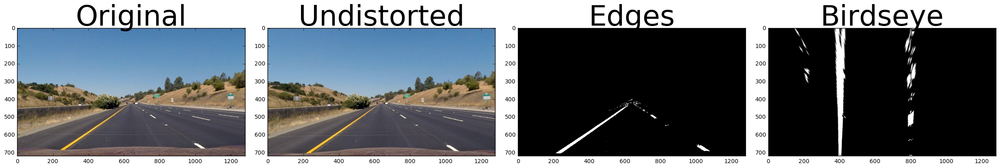

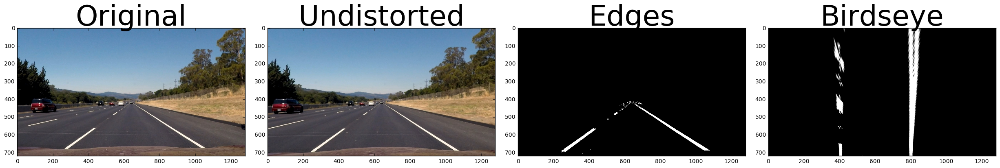

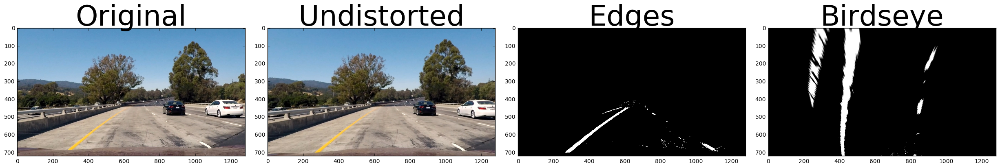

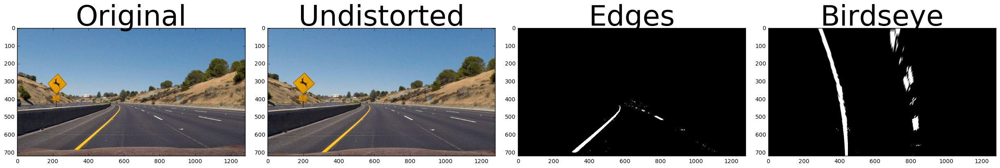

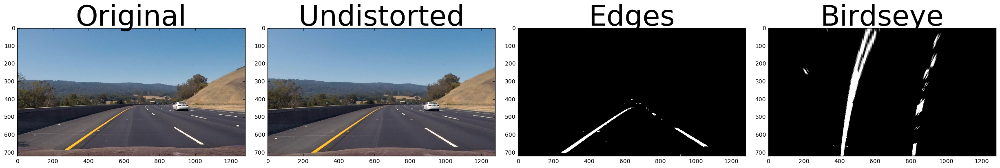

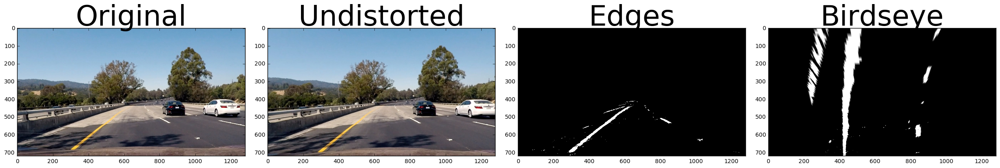

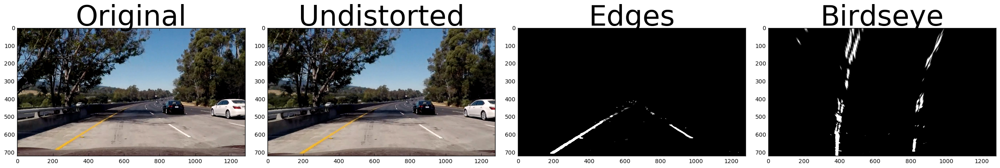

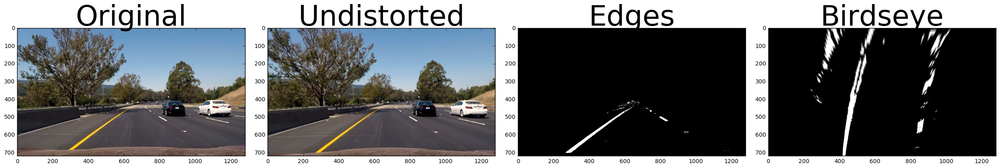

In [59]:
# get the stored undistortion matrices
dist_pickle = pickle.load(open( "dist_pickle.p", "rb" ))
mtx = dist_pickle['mtx']
dist = dist_pickle['dist']

images = glob.glob(img_path+'*.jpg')

debug = DEBUGMODE

for fname in images:
    c_img_raw = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB) #CAUTION: cv2.imread reads in BGR

    # Undisttort the image
    c_img_undist = cv2.undistort(c_img_raw, mtx, dist, None, mtx)
    if(debug==1):
        cv2.imwrite(img_path+'undist.jpg',c_img_undist)
        
    # process the image to get the Edges
    b_edges = get_edges(c_img_undist, mtx, dist)
    if(debug==1):
        cv2.imwrite(img_path+'edges.jpg',b_edges)

    # Perspective Transform
    b_birdseye, M, Minv = perspective_transform(b_edges)
    if(debug==1):
        cv2.imwrite(img_path+'topview.jpg',b_topview)
    
    # Use topview to find_lane_lines
    c_img_lane = find_lane_boundary(b_birdseye)
    if(debug==1):
        cv2.imwrite(img_path+'topview.jpg',c_img_lane)
        
    # Plot the result
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(c_img_raw)
    ax1.set_title('Original', fontsize=50)

    ax2.imshow(c_img_undist)
    ax2.set_title('Undistorted', fontsize=50)
    
    ax3.imshow(b_edges, cmap='gray')
    ax3.set_title('Edges', fontsize=50)
    
    ax4.imshow(b_birdseye, cmap='gray')
    ax4.set_title('Birdseye', fontsize=50)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

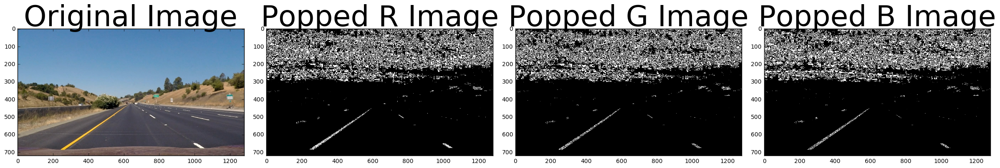

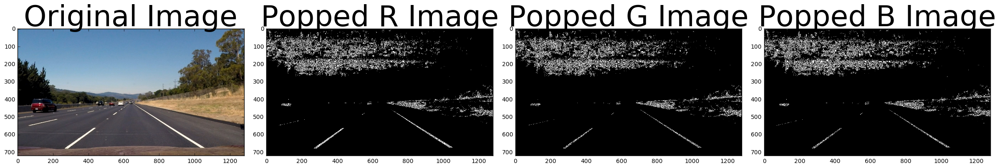

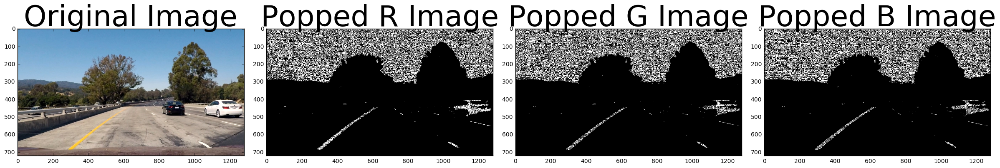

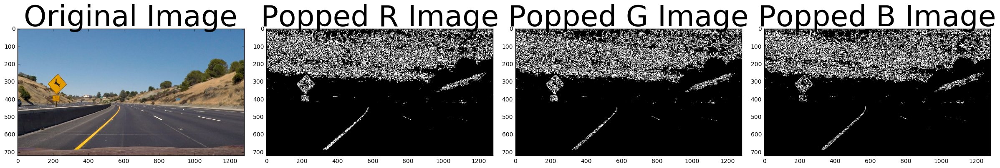

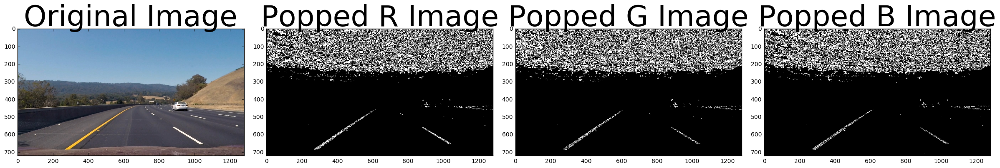

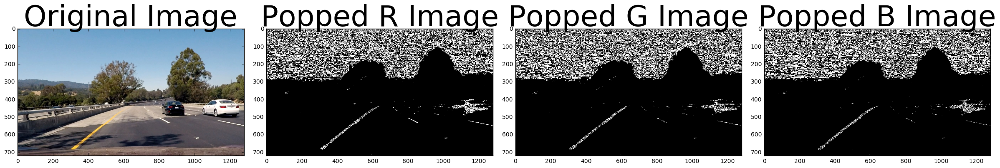

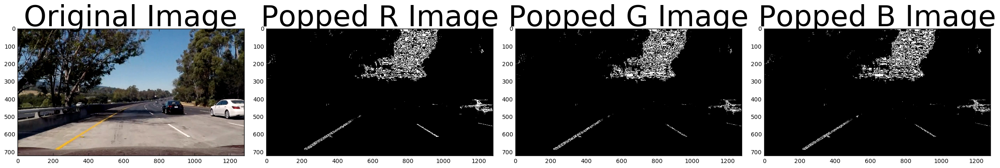

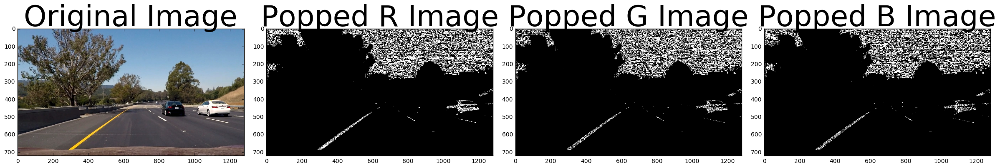

In [25]:
images = glob.glob(img_path+'*.jpg')
for fname in images:
    c_img_raw = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB) #CAUTION: cv2.imread reads in BGR

    b_color = color_select(c_img_raw, sthresh=(100, 255), vthresh=(100, 255))
    
    c_img_pop_R = cv2.bitwise_and(c_img_raw[:,:,0], b_color)
    c_img_pop_G = cv2.bitwise_and(c_img_raw[:,:,1], b_color)
    c_img_pop_B = cv2.bitwise_and(c_img_raw[:,:,2], b_color)

    # Plot the result
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(c_img_raw)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(c_img_pop_R, cmap='gray')
    ax2.set_title('Popped R Image', fontsize=50)    
    ax3.imshow(c_img_pop_G, cmap='gray')
    ax3.set_title('Popped G Image', fontsize=50)    
    ax4.imshow(c_img_pop_B, cmap='gray')
    ax4.set_title('Popped B Image', fontsize=50)    